In [25]:
import pandas as pd
import numpy as np
import scipy

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import classification_report, accuracy_score 
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [26]:
#  the main dataset for analysis
df = pd.read_csv(r'C:\Users\hp\Downloads\MusicGenrePredPCA\data\music_dataset_mod.csv')
df.head()

,Tempo,Dynamics Range,Vocal Presence,Percussion Strength,String Instrument Detection,Electronic Element Presence,Rhythm Complexity,Drums Influence,Distorted Guitar,Metal Frequencies,Ambient Sound Influence,Instrumental Overlaps,Genre
0,114.618354,57.976367,53.251766,99.061840,14.686768,17.628630,46.545522,75.839434,79.378892,71.753088,96.439665,53.771763,Country
1,116.672803,69.387087,95.787280,90.831033,47.280419,-15.618194,85.421085,100.455908,0.713015,0.000000,17.327295,15.017146,Classical
2,128.328121,52.930677,65.701187,104.439247,5.984994,50.467388,18.006722,77.642913,80.652946,87.692110,95.125207,25.308020,Rock
3,128.511337,25.494755,14.095374,40.106130,47.715584,87.335201,68.603329,63.536557,74.888346,76.239108,97.016998,96.893109,Hip-hop
4,135.474190,45.174876,101.469872,70.002203,108.177637,25.865590,31.295163,81.121030,36.178193,23.381542,53.753793,30.142986,Country


In [27]:
print("Music Dataset Mod columns are : ", list(df.columns))

Music Dataset Mod columns are :  ['Tempo', 'Dynamics Range', 'Vocal Presence', 'Percussion Strength', 'String Instrument Detection', 'Electronic Element Presence', 'Rhythm Complexity', 'Drums Influence', 'Distorted Guitar', 'Metal Frequencies', 'Ambient Sound Influence', 'Instrumental Overlaps', 'Genre']


In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Tempo                        1000 non-null   float64
 1   Dynamics Range               1000 non-null   float64
 2   Vocal Presence               1000 non-null   float64
 3   Percussion Strength          1000 non-null   float64
 4   String Instrument Detection  1000 non-null   float64
 5   Electronic Element Presence  1000 non-null   float64
 6   Rhythm Complexity            1000 non-null   float64
 7   Drums Influence              1000 non-null   float64
 8   Distorted Guitar             1000 non-null   float64
 9   Metal Frequencies            1000 non-null   float64
 10  Ambient Sound Influence      1000 non-null   float64
 11  Instrumental Overlaps        1000 non-null   float64
 12  Genre                        890 non-null    object 
dtypes: float64(12), obj

# 📊 Music Dataset - Feature Descriptions

The dataset consists of various musical features derived from tracks across multiple genres. Below is a concise description of each feature:

| Feature                      | Data Type  | Description                                                                                  |
|------------------------------|------------|----------------------------------------------------------------------------------------------|
| **Tempo**                   | Numerical  | Beats per minute (BPM) of the track, indicating the speed of the music.                     |
| **Dynamics Range**          | Numerical  | Range between the quietest and loudest parts of a track, measured in decibels (dB).         |
| **Vocal Presence**          | Numerical  | The prominence of vocals in a track, indicating how dominant the vocals are.                |
| **Percussion Strength**     | Numerical  | The intensity of percussion instruments like drums and cymbals in a track.                  |
| **String Instrument Detection** | Numerical | The presence and prominence of string instruments (e.g., guitars, violins, cellos).        |
| **Electronic Element Presence** | Numerical | The presence of electronic sounds or synthesizers in the track.                             |
| **Rhythm Complexity**       | Numerical  | The complexity and variation in rhythm patterns, reflecting intricate beats and timing.     |
| **Drums Influence**         | Numerical  | The contribution of drums to the overall sound, focusing on their impact.                   |
| **Distorted Guitar**        | Numerical  | The extent to which distorted guitar sounds are used, often linked with rock/metal genres.  |
| **Metal Frequencies**       | Numerical  | The usage of high frequencies typically associated with metal music.                        |
| **Ambient Sound Influence** | Numerical  | The integration of ambient sounds to add texture and atmosphere to the track.               |
| **Instrumental Overlaps**   | Numerical  | Indicates how different instruments overlap, showing the complexity of arrangements.        |
| **Genre**                   | Categorical| The categorized genre of the track (target variable).                                       |

---

### **Key Notes:**
- The dataset includes **12 numerical features** and **1 categorical target feature ('Genre')**.
- The target feature **'Genre'** indicates the music genre classification for each track.
- The features cover a range of musical elements from tempo and rhythm to instrumental and electronic components.

---


In [29]:
df.isnull().sum()

Tempo                            0
Dynamics Range                   0
Vocal Presence                   0
Percussion Strength              0
String Instrument Detection      0
Electronic Element Presence      0
Rhythm Complexity                0
Drums Influence                  0
Distorted Guitar                 0
Metal Frequencies                0
Ambient Sound Influence          0
Instrumental Overlaps            0
Genre                          110
dtype: int64

- The 'Genre' column has 110 missing values (1000 - 890 = 110).
- All other columns are fully populated with no missing values.

In [30]:
# Display rows where 'Genre' is NaN
missing_genre_rows = df[df['Genre'].isna()]
missing_genre_rows

,Tempo,Dynamics Range,Vocal Presence,Percussion Strength,String Instrument Detection,Electronic Element Presence,Rhythm Complexity,Drums Influence,Distorted Guitar,Metal Frequencies,Ambient Sound Influence,Instrumental Overlaps,Genre
13,104.389822,65.826509,45.855410,55.655533,76.058845,55.625315,25.312585,59.202818,0.920308,0.000000,94.308889,27.441046,NaN
18,101.367152,47.843370,93.230347,67.101777,20.932163,50.772288,30.348312,62.950165,64.462755,68.971944,21.690071,94.717315,NaN
22,85.130539,55.707108,81.149615,21.473425,14.959208,61.017283,64.000152,43.332846,70.455879,79.053598,20.420619,99.499498,NaN
31,121.100952,71.769727,49.609529,82.539647,47.670106,119.460607,68.812707,83.727876,95.307620,95.779062,2.883916,19.230684,NaN
42,93.546825,44.563761,56.587554,99.546134,109.735122,30.128106,48.392807,81.888793,97.200948,100.000000,16.380240,55.483399,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,130.719110,65.990957,21.775950,91.817048,34.029452,105.525736,28.552899,99.587397,1.414556,0.000000,59.447447,74.901837,NaN
992,117.892313,35.001524,76.506358,77.972570,80.765657,13.759213,59.985923,80.108786,93.831262,100.000000,15.851851,47.984445,NaN
993,104.315096,26.173723,3.334345,42.132602,38.434513,66.522798,62.051560,79.475348,61.390214,52.925363,50.383816,52.630256,NaN
994,121.863373,50.872678,70.100162,106.212013,66.573813,89.927526,3.009635,79.634816,15.398297,31.235519,11.997421,57.281283,NaN


I identified that the 'Genre' column has 110 missing values. 

- My plan is to train on the 890 labeled tracks & predict the genres for the 110 missing ones.

In [31]:
print("Unique genres in this dataframe" ,list(df['Genre'].unique()))

Unique genres in this dataframe ['Country', 'Classical', 'Rock', 'Hip-hop', nan, 'Jazz']


C:\Users\hp\AppData\Local\Temp\ipykernel_8208\2401827864.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Genre', palette='Set2')


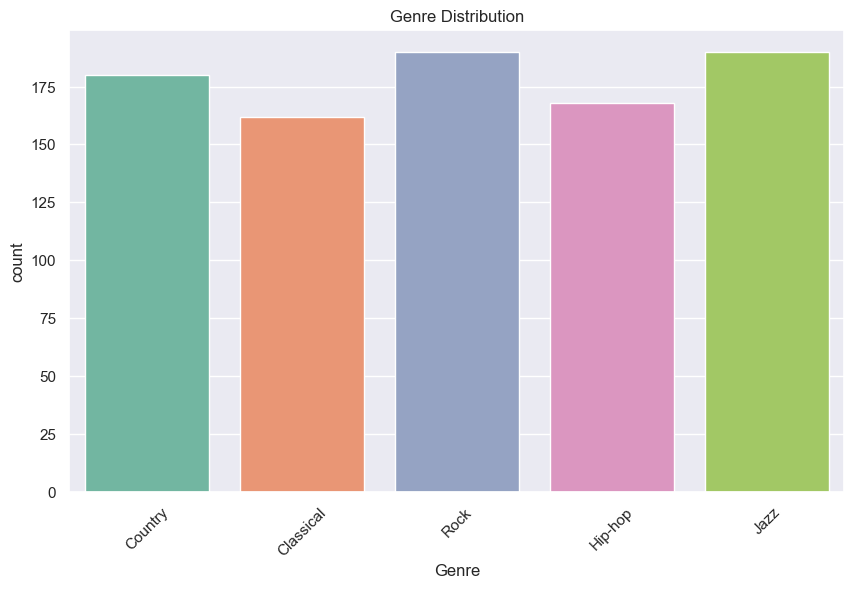

In [32]:
# Visualize the genre distribution

plt.figure(figsize=(10,6))
sns.countplot(data=df, x='Genre', palette='Set2')
plt.title('Genre Distribution')
plt.xticks(rotation=45)
plt.show()

C:\Users\hp\AppData\Local\Temp\ipykernel_8208\1920420615.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df['Genre'].isna(), palette='Set2')


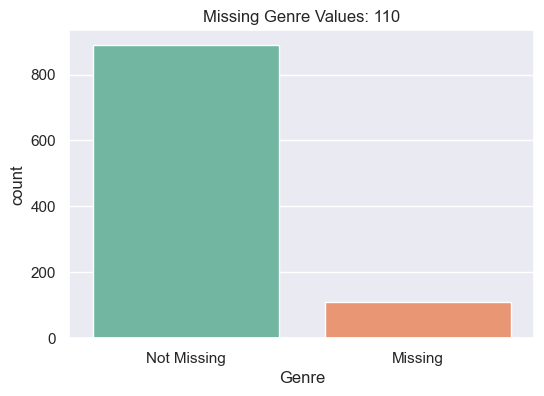

In [33]:
# Visualize missing genre entries
missing_genre = df['Genre'].isna().sum()
plt.figure(figsize=(6,4))
sns.countplot(x=df['Genre'].isna(), palette='Set2')
plt.title(f'Missing Genre Values: {missing_genre}')
plt.xticks([0, 1], ['Not Missing', 'Missing'])
plt.show()

<Figure size 1400x800 with 0 Axes>

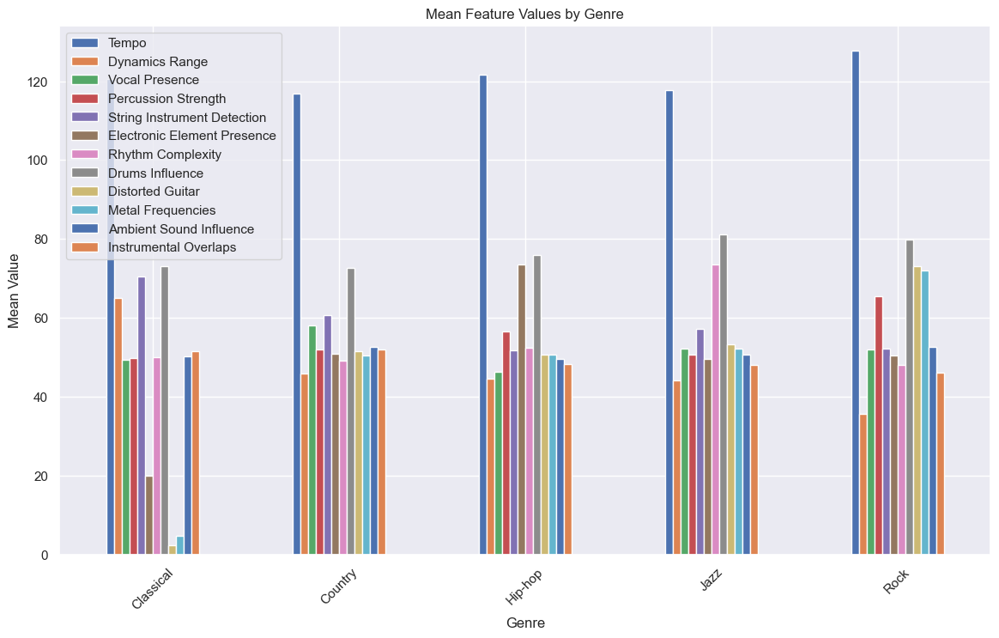

In [34]:
# Grouping by genre and calculating the mean for each feature
genre_group = df.groupby('Genre').mean()

# Visualize the grouped data
plt.figure(figsize=(14,8))
genre_group.plot(kind='bar', stacked=False, figsize=(14,8))
plt.title('Mean Feature Values by Genre')
plt.ylabel('Mean Value')
plt.xticks(rotation=45)
plt.show()

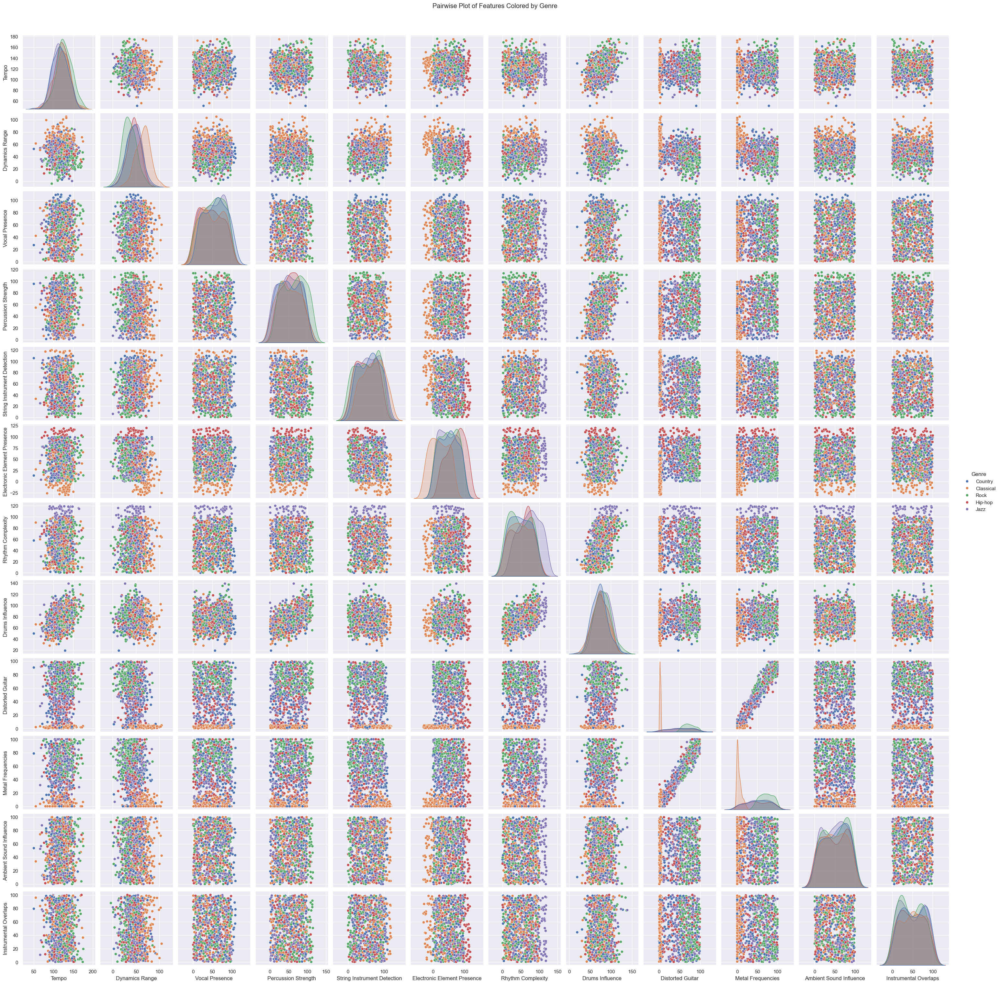

In [35]:
# Pairplot to show feature relationships by genre
sns.pairplot(df, hue='Genre', height=2.5)
plt.suptitle('Pairwise Plot of Features Colored by Genre', y=1.02)
plt.show()

C:\Users\hp\AppData\Local\Temp\ipykernel_8208\2809034593.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Genre', y='Tempo', palette='Set2')


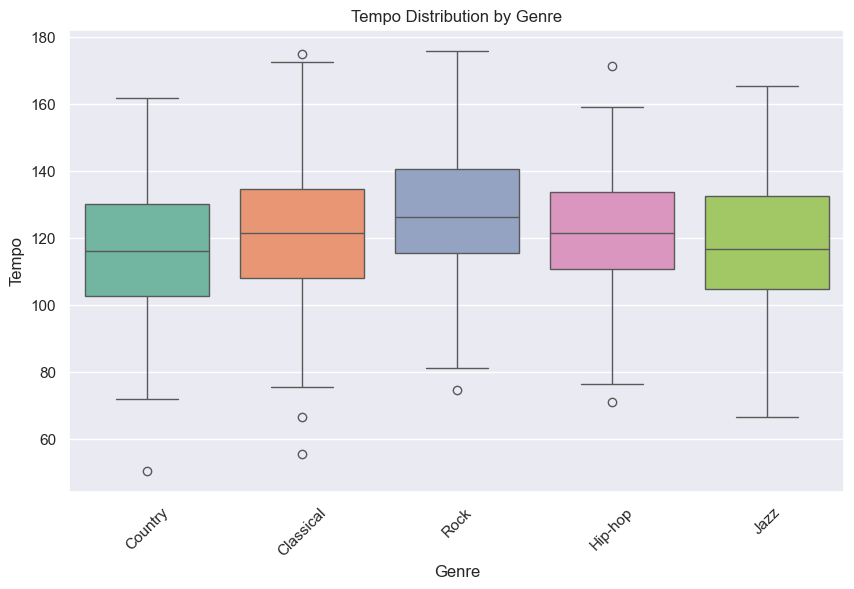

C:\Users\hp\AppData\Local\Temp\ipykernel_8208\2809034593.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Genre', y='Dynamics Range', palette='Set2')


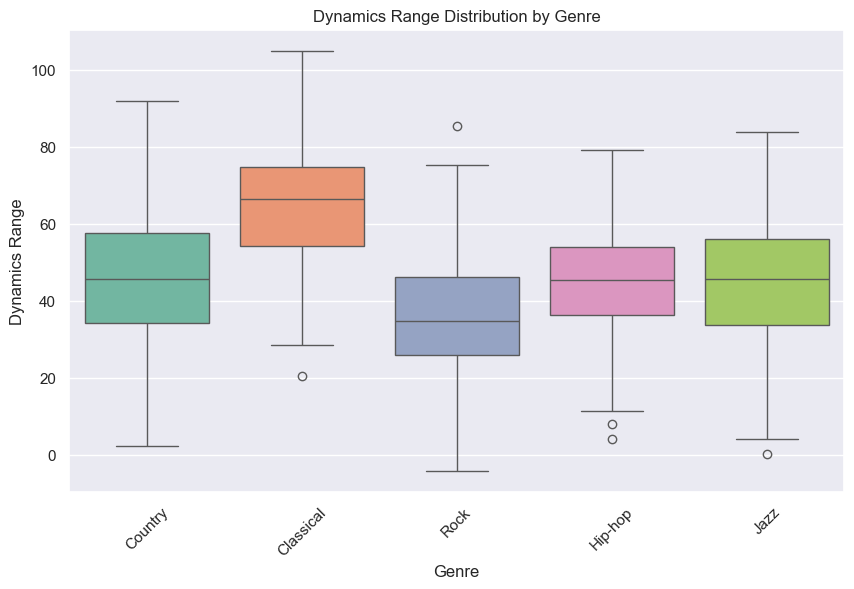

In [36]:
# Boxplot for Tempo by Genre
plt.figure(figsize=(10,6))
sns.boxplot(data=df, x='Genre', y='Tempo', palette='Set2')
plt.title('Tempo Distribution by Genre')
plt.xticks(rotation=45)
plt.show()

# Boxplot for Dynamics Range by Genre
plt.figure(figsize=(10,6))
sns.boxplot(data=df, x='Genre', y='Dynamics Range', palette='Set2')
plt.title('Dynamics Range Distribution by Genre')
plt.xticks(rotation=45)
plt.show()


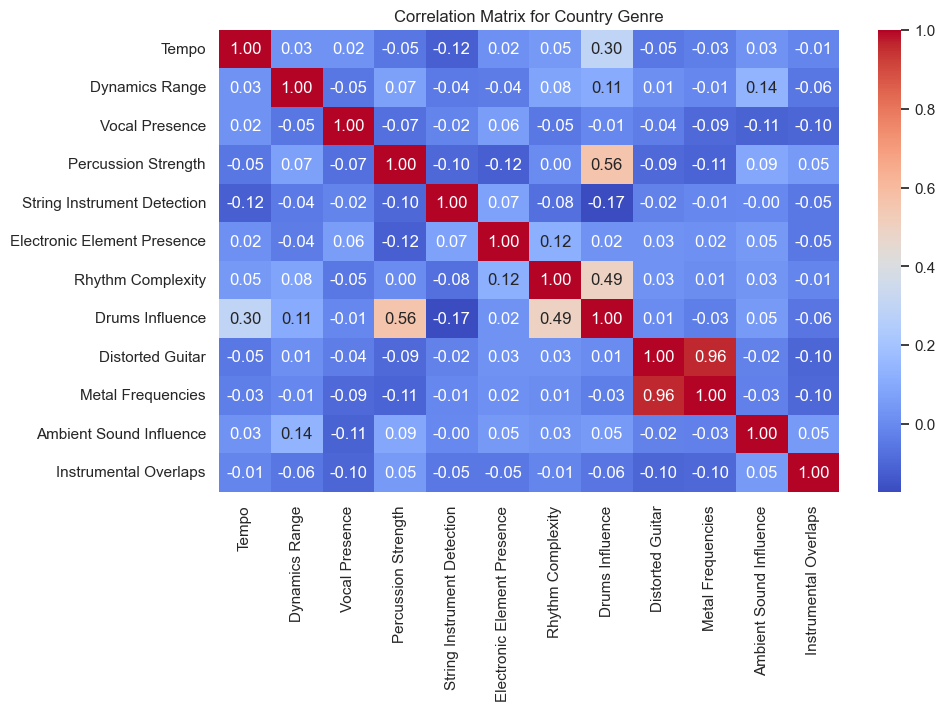

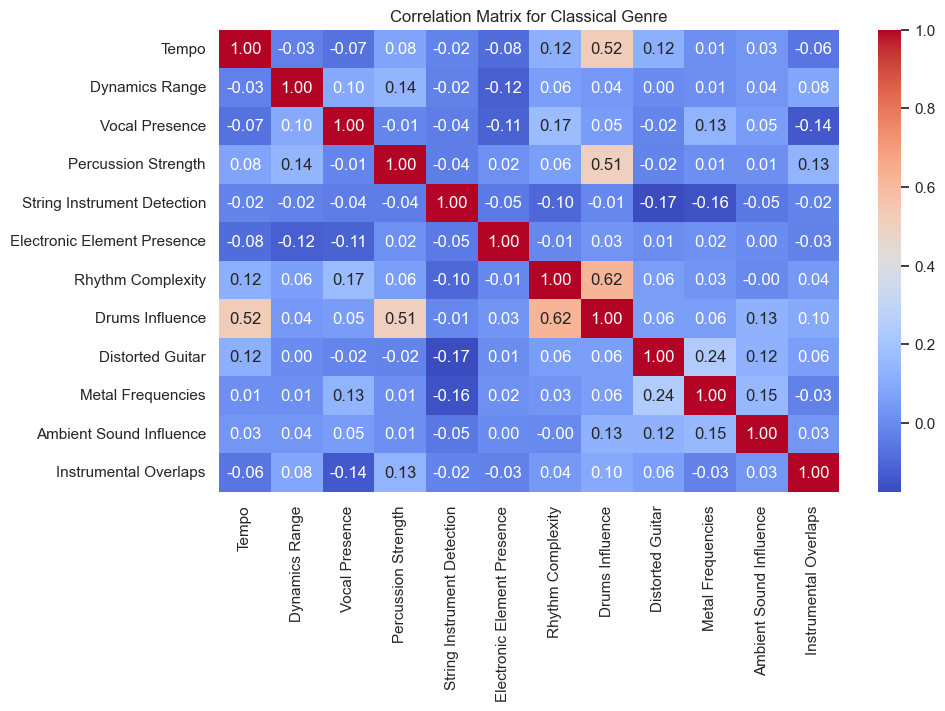

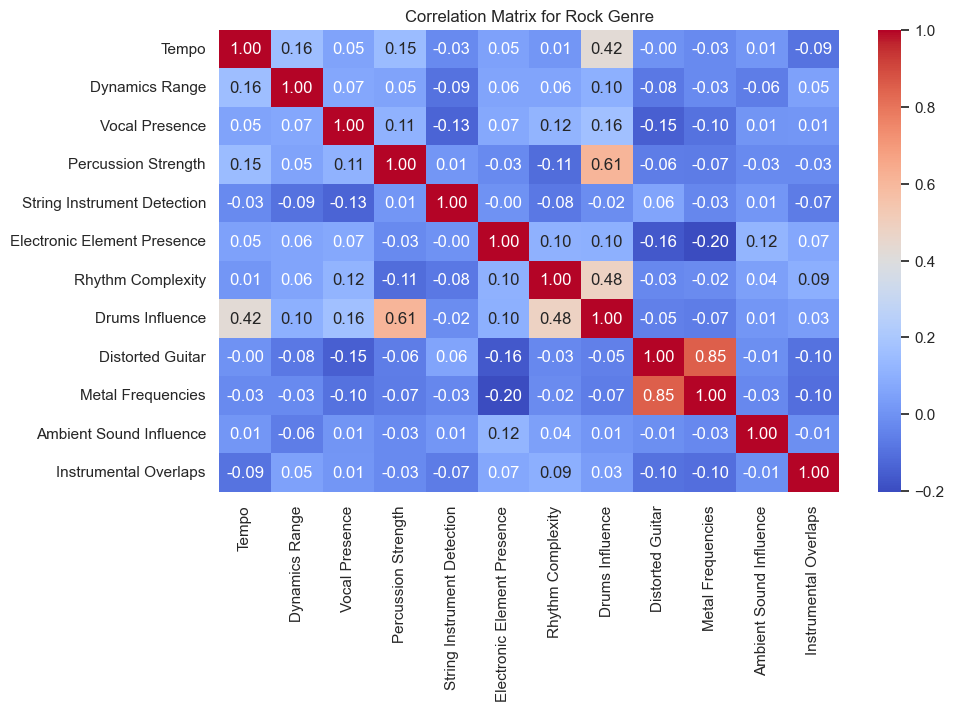

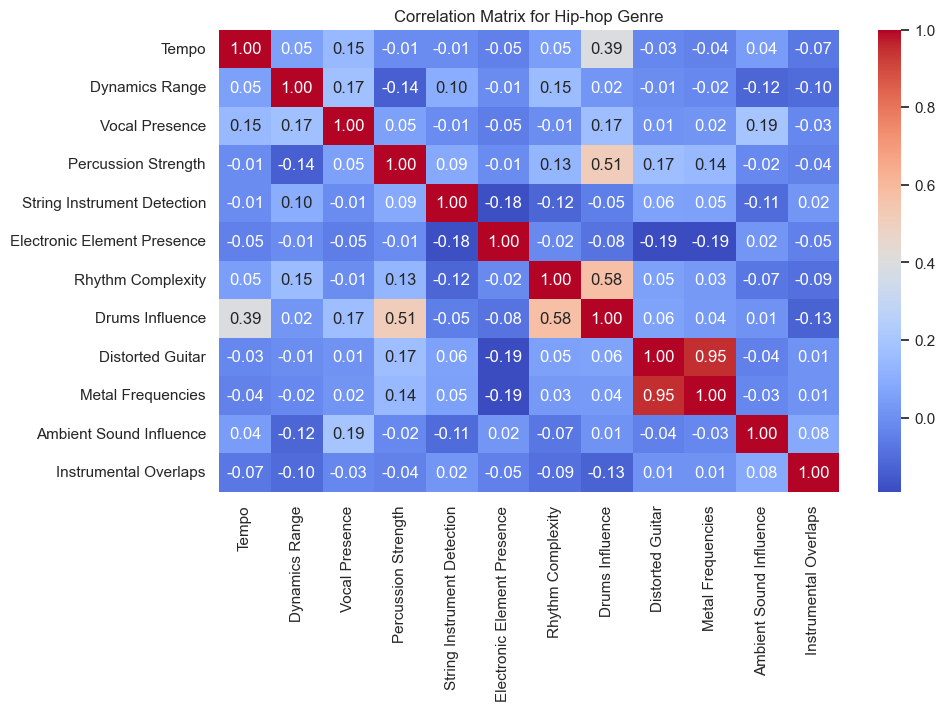

c:\Users\hp\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
c:\Users\hp\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


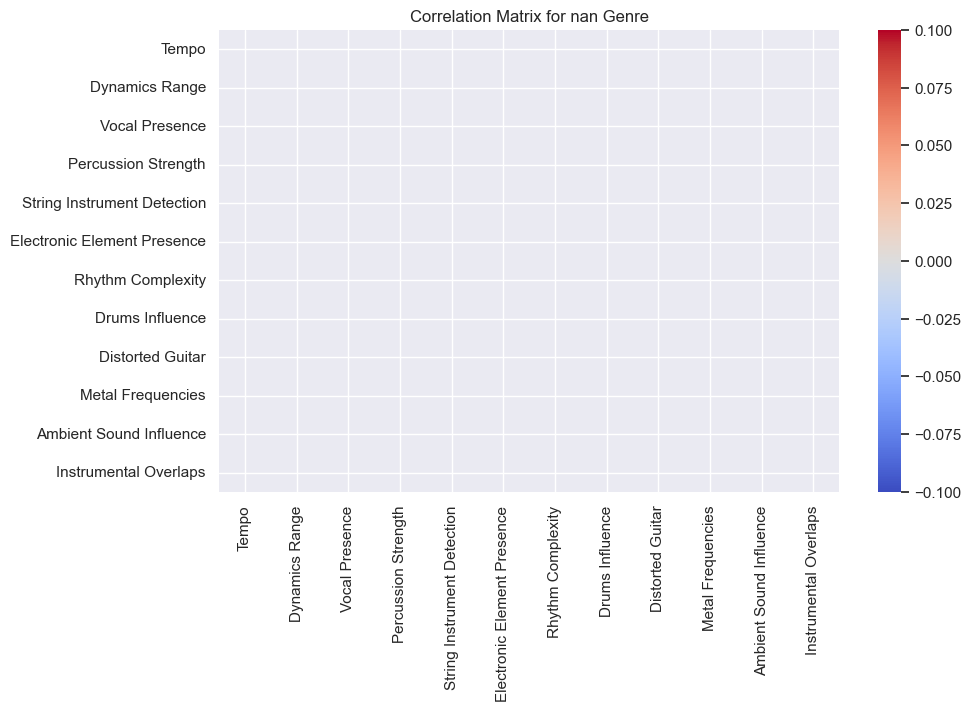

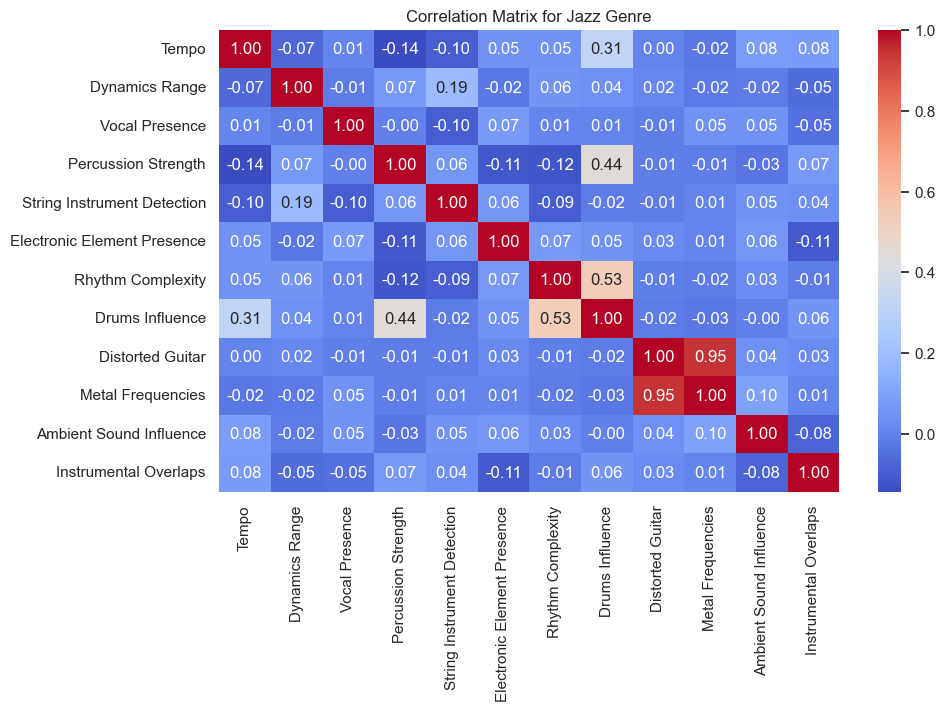

In [37]:
# Create a heatmap of correlations by genre
for genre in df['Genre'].unique():
    genre_data = df[df['Genre'] == genre]
    correlation_matrix = genre_data.drop('Genre', axis=1).corr()
    plt.figure(figsize=(10,6))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title(f'Correlation Matrix for {genre} Genre')
    plt.show()


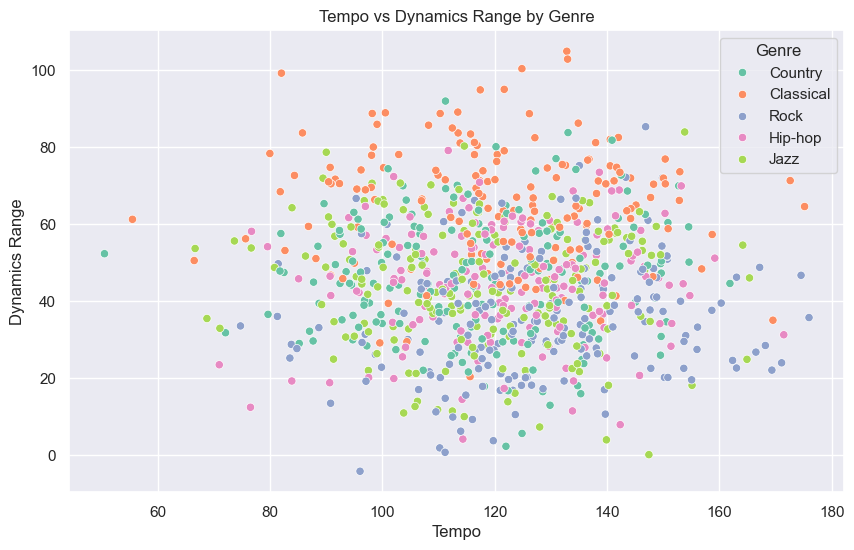

In [38]:
# Scatter plot of Tempo vs Dynamics Range by Genre
plt.figure(figsize=(10,6))
sns.scatterplot(data=df, x='Tempo', y='Dynamics Range', hue='Genre', palette='Set2')
plt.title('Tempo vs Dynamics Range by Genre')
plt.show()


In [39]:
df.dtypes

Tempo                          float64
Dynamics Range                 float64
Vocal Presence                 float64
Percussion Strength            float64
String Instrument Detection    float64
Electronic Element Presence    float64
Rhythm Complexity              float64
Drums Influence                float64
Distorted Guitar               float64
Metal Frequencies              float64
Ambient Sound Influence        float64
Instrumental Overlaps          float64
Genre                           object
dtype: object

In [40]:
# Check for any non-numeric values in the entire DataFrame
for col in df.columns:
    non_numeric_rows = df[col].apply(lambda x: isinstance(x, str))
    if non_numeric_rows.any():
        print(f"Non-numeric value found in column '{col}':")
        print(df[non_numeric_rows][col].unique())

Non-numeric value found in column 'Genre':
['Country' 'Classical' 'Rock' 'Hip-hop' 'Jazz']


In [41]:
# numeric columns only
df_numeric = df.drop(columns=['Genre']).copy()

# corr matrix
correlation_matrix = df_numeric.corr()

metal_distorted_corr = correlation_matrix.loc['Metal Frequencies', 'Distorted Guitar']

print(f"The correlation coefficient between Metal Frequencies and Distorted Guitar is: {metal_distorted_corr:.2f}")


The correlation coefficient between Metal Frequencies and Distorted Guitar is: 0.97


In [42]:
# standardize the data ( without target column "genre")
numeric_columns = df.drop(columns=['Genre'])
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_columns)

# apply PCA
pca = PCA()
pca.fit(scaled_data)

# cum var 
cumulative_variance = pca.explained_variance_ratio_.cumsum()

# num components to capture at least 80% variance
n_components_80 = (cumulative_variance >= 0.80).argmax() + 1

print(f"The minimum number of components to capture at least 80% of the variance is: {n_components_80}")

The minimum number of components to capture at least 80% of the variance is: 8


In [43]:
# rows where 'Genre' is NaN (110 rows)
df_cleaned = df.dropna(subset=['Genre'])

# data prep
X = df_cleaned.drop(columns=['Genre'])
y = df_cleaned['Genre']

In [44]:
# split  train & test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# standardize  features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [45]:
# model without PCA

log_reg = LogisticRegression(max_iter=10000)
log_reg.fit(X_train_scaled, y_train)
y_pred_no_pca = log_reg.predict(X_test_scaled)
accuracy_no_pca = accuracy_score(y_test, y_pred_no_pca)

print(f"Accuracy without PCA: {accuracy_no_pca:.4f}")

Accuracy without PCA: 0.5562


In [46]:
X_train_scaled

array([[ 0.47699442,  0.24751612,  0.08183553, ..., -1.45857428,
        -0.91824585, -1.44307033],
       [-0.14473903, -1.58697922,  0.56352241, ...,  0.00294935,
         0.78730358,  0.98190537],
       [ 1.37707752,  0.12958627,  0.83567937, ...,  0.45730266,
        -0.90277119,  1.62094528],
       ...,
       [ 1.27954592,  0.11794295, -1.65231537, ...,  0.6001579 ,
        -1.40766111, -0.38414705],
       [-1.5874242 ,  1.07312405, -0.55461779, ...,  0.02048039,
        -0.58038168, -1.58012757],
       [-0.73610368, -0.36548364,  0.12291412, ...,  1.57741659,
         1.31185279, -1.34908934]])

In [47]:
y_train

778    Classical
261      Country
409         Rock
880         Rock
741      Country
         ...    
119      Hip-hop
295      Country
948         Rock
470      Country
113         Jazz
Name: Genre, Length: 712, dtype: object

In [48]:
# precision score for 'Hip-hop' without PCA
report_no_pca = classification_report(y_test, y_pred_no_pca, output_dict=True)
precision_no_pca = report_no_pca['Hip-hop']['precision']

print(f"Precision for 'Hip-hop' without PCA: {precision_no_pca:.4f}")

Precision for 'Hip-hop' without PCA: 0.4800


In [49]:
# apply PCA
pca = PCA(n_components=n_components_80)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

In [50]:
# train log reg model with PCA
log_reg_pca = LogisticRegression(max_iter=10000)
log_reg_pca.fit(X_train_pca, y_train)
y_pred_pca = log_reg_pca.predict(X_test_pca)

In [51]:
# precision score for 'Hip-hop' with PCA
report_pca = classification_report(y_test, y_pred_pca, output_dict=True)
precision_pca = report_pca['Hip-hop']['precision']

print(f"Precision for 'Hip-hop' with PCA: {precision_pca:.4f}")

Precision for 'Hip-hop' with PCA: 0.4194


In [52]:
# the difference in precision
precision_difference = precision_no_pca - precision_pca
print(f"Difference in precision for 'Hip-hop' (without PCA - with PCA): {precision_difference:.4f}")

Difference in precision for 'Hip-hop' (without PCA - with PCA): 0.0606


In [53]:
accuracy_no_pca = accuracy_score(y_test, y_pred_no_pca)
print(f"Accuracy without PCA: {accuracy_no_pca:.4f}")


accuracy_pca = accuracy_score(y_test, y_pred_pca)
print(f"Accuracy with PCA: {accuracy_pca:.4f}")

Accuracy without PCA: 0.5562
Accuracy with PCA: 0.5112


In [54]:
# best-performing model
best_model = log_reg_pca if accuracy_pca > accuracy_no_pca else log_reg # log_reg is log reg without PCA

# extract the features for track 992
track_992_features = df.iloc[992].drop('Genre')

# If using PCA, transform the features
if best_model == log_reg_pca:
    track_992_features = scaler.transform([track_992_features])  # Scale the features first
    track_992_features = pca.transform(track_992_features)
else:
    track_992_features = scaler.transform([track_992_features])  # Only scale if not using PCA

# predict the genre for track 992
predicted_genre = best_model.predict(track_992_features)

print(f"The predicted genre for track number 992 is: {predicted_genre[0]}")

The predicted genre for track number 992 is: Rock


c:\Users\hp\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
